In [1]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import sys

from statsmodels.tsa.api import VAR
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn import preprocessing
from sklearn.metrics import mean_squared_error, mean_absolute_error

from keras.models import Sequential
from keras.layers import Dropout

import tensorflow as tf
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam

In [2]:
print("Choose the number corresponding to the location site and press enter:")
print("1. Aotizhongxin\n2. Changping\n3. Dingling\n4. Dongsi\n5. Guanyuan\n6. Gucheng\n7. Huairou\n8. Nongzhanguan\n9. Shunyi\n10. Tiantan\n11. Wanliu\n12. Wanshouxigong\n")

Choose the number corresponding to the location site and press enter:
1. Aotizhongxin
2. Changping
3. Dingling
4. Dongsi
5. Guanyuan
6. Gucheng
7. Huairou
8. Nongzhanguan
9. Shunyi
10. Tiantan
11. Wanliu
12. Wanshouxigong



In [3]:
location = input()

1


In [4]:
if int(location)==1:
    data_original = pd.read_csv("PRSA_Data_Aotizhongxin_20130301-20170228.csv")
if int(location)==2:
    data_original = pd.read_csv("PRSA_Data_Changping_20130301-20170228.csv")
if int(location)==3:
    data_original = pd.read_csv("PRSA_Data_Dingling_20130301-20170228.csv")
if int(location)==4:
    data_original = pd.read_csv("PRSA_Data_Dongsi_20130301-20170228.csv")
if int(location)==5:
    data_original = pd.read_csv("PRSA_Data_Guanyuan_20130301-20170228.csv")
if int(location)==6:
    data_original = pd.read_csv("PRSA_Data_Gucheng_20130301-20170228.csv")
if int(location)==7:
    data_original = pd.read_csv("PRSA_Data_Huairou_20130301-20170228.csv")
if int(location)==8:
    data_original = pd.read_csv("PRSA_Data_Nongzhanguan_20130301-20170228.csv")
if int(location)==9:
    data_original = pd.read_csv("PRSA_Data_Shunyi_20130301-20170228.csv")
if int(location)==10:
    data_original = pd.read_csv("PRSA_Data_Tiantan_20130301-20170228.csv")
if int(location)==11:
    data_original = pd.read_csv("PRSA_Data_Wanliu_20130301-20170228.csv")
if int(location)==12:
    data_original = pd.read_csv("PRSA_Data_Wanshouxigong_20130301-20170228.csv")

In [5]:
# checking general properties of data

print(data_original.head())

   No  year  month  day  hour  PM2.5  PM10   SO2   NO2     CO    O3  TEMP  \
0   1  2013      3    1     0    4.0   4.0   4.0   7.0  300.0  77.0  -0.7   
1   2  2013      3    1     1    8.0   8.0   4.0   7.0  300.0  77.0  -1.1   
2   3  2013      3    1     2    7.0   7.0   5.0  10.0  300.0  73.0  -1.1   
3   4  2013      3    1     3    6.0   6.0  11.0  11.0  300.0  72.0  -1.4   
4   5  2013      3    1     4    3.0   3.0  12.0  12.0  300.0  72.0  -2.0   

     PRES  DEWP  RAIN   wd  WSPM       station  
0  1023.0 -18.8   0.0  NNW   4.4  Aotizhongxin  
1  1023.2 -18.2   0.0    N   4.7  Aotizhongxin  
2  1023.5 -18.2   0.0  NNW   5.6  Aotizhongxin  
3  1024.5 -19.4   0.0   NW   3.1  Aotizhongxin  
4  1025.2 -19.5   0.0    N   2.0  Aotizhongxin  


In [6]:
print(data_original.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34139 non-null  float64
 6   PM10     34346 non-null  float64
 7   SO2      34129 non-null  float64
 8   NO2      34041 non-null  float64
 9   CO       33288 non-null  float64
 10  O3       33345 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34983 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None


In [7]:
print(data_original.describe(include='all'))

                  No          year         month           day          hour  \
count   35064.000000  35064.000000  35064.000000  35064.000000  35064.000000   
unique           NaN           NaN           NaN           NaN           NaN   
top              NaN           NaN           NaN           NaN           NaN   
freq             NaN           NaN           NaN           NaN           NaN   
mean    17532.500000   2014.662560      6.522930     15.729637     11.500000   
std     10122.249256      1.177213      3.448752      8.800218      6.922285   
min         1.000000   2013.000000      1.000000      1.000000      0.000000   
25%      8766.750000   2014.000000      4.000000      8.000000      5.750000   
50%     17532.500000   2015.000000      7.000000     16.000000     11.500000   
75%     26298.250000   2016.000000     10.000000     23.000000     17.250000   
max     35064.000000   2017.000000     12.000000     31.000000     23.000000   

               PM2.5          PM10     

In [8]:
# checking the categorical attribute "wd"
print("Unique values of wd: ", data_original['wd'].unique())
print("No. of unique values of wd: ", data_original['wd'].nunique())

Unique values of wd:  ['NNW' 'N' 'NW' 'NNE' 'ENE' 'E' 'NE' 'W' 'SSW' 'WSW' 'SE' 'WNW' 'SSE'
 'ESE' 'S' 'SW' nan]
No. of unique values of wd:  16


In [9]:
# Creating a dataframe for time
time = pd.DataFrame([data_original["year"],data_original["month"],data_original["day"],data_original["hour"]])
time = time.T

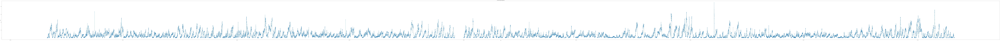

In [10]:
# Drawing a time series graph of data
x_time = pd.to_datetime(time, format='%Y/%m/%d%H')
y_total = data_original["PM2.5"]  
plt.figure(figsize=(500,20))  
plt.plot_date(x_time, y_total, linestyle='-')
plt.xlabel('Time')
plt.ylabel('PM2.5')
plt.title('Time Series Graph of Original Data')
plt.show()

In [11]:
# Dropping the columns which are not required
data_original = data_original.drop(['No','year','month','day','hour','station'], axis=1)

In [12]:
# On hot encoding using pd.get_dummies() for wind direction
data_original = pd.get_dummies(data_original, columns = ["wd"])

In [13]:
# Checking null values again
print(data_original.isnull().sum())

PM2.5      925
PM10       718
SO2        935
NO2       1023
CO        1776
O3        1719
TEMP        20
PRES        20
DEWP        20
RAIN        20
WSPM        14
wd_E         0
wd_ENE       0
wd_ESE       0
wd_N         0
wd_NE        0
wd_NNE       0
wd_NNW       0
wd_NW        0
wd_S         0
wd_SE        0
wd_SSE       0
wd_SSW       0
wd_SW        0
wd_W         0
wd_WNW       0
wd_WSW       0
dtype: int64


In [14]:
# Putting 0 as special values for NaN (missing) data
data_original = data_original.fillna(0)

In [15]:
# Checking data description again
pd.set_option('display.max_columns', None)
print(data_original.describe())

              PM2.5          PM10           SO2           NO2            CO  \
count  35064.000000  35064.000000  35064.000000  35064.000000  35064.000000   
mean      80.590015    107.806702     16.912564     57.575572   1198.976671   
std       82.123560     95.523363     22.690005     37.908344   1221.899259   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%       20.000000     35.000000      3.000000     28.000000    500.000000   
50%       56.000000     84.000000      8.000000     52.000000    800.000000   
75%      112.000000    153.000000     21.000000     81.000000   1500.000000   
max      898.000000    984.000000    341.000000    290.000000  10000.000000   

                 O3          TEMP          PRES          DEWP          RAIN  \
count  35064.000000  35064.000000  35064.000000  35064.000000  35064.000000   
mean      53.590655     13.576859   1011.269777      3.121281      0.067383   
std       57.774667     11.400460     26.302970    

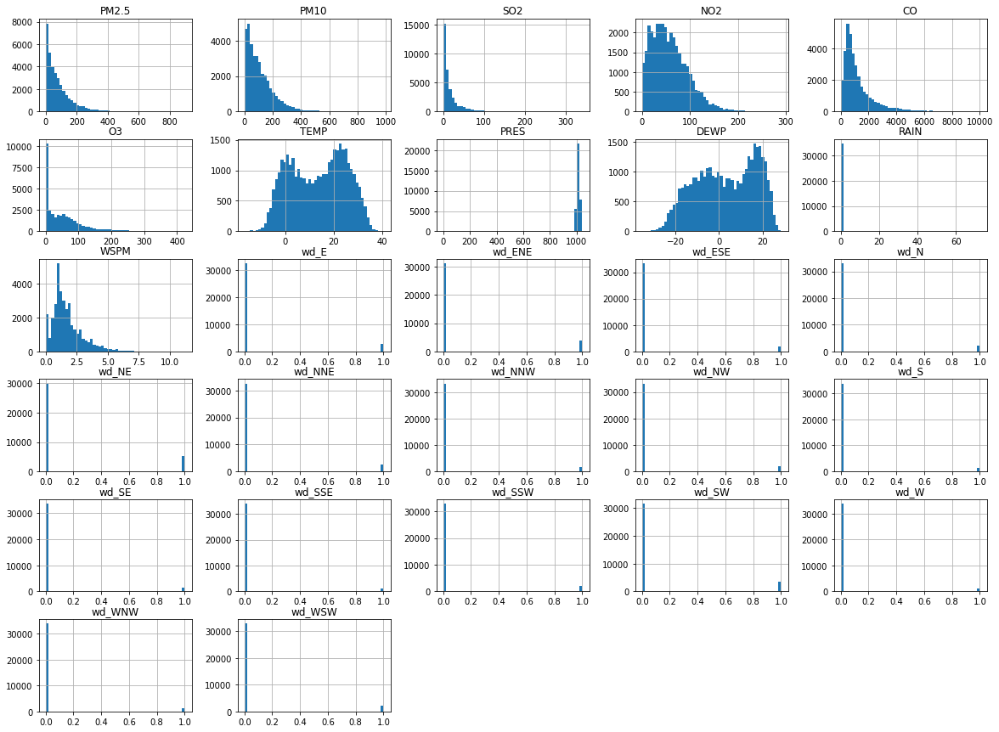

In [16]:
# Plotting the historgam of attributes to check for outliers
data_original.hist(bins=50, figsize=(20, 15))
plt.show()

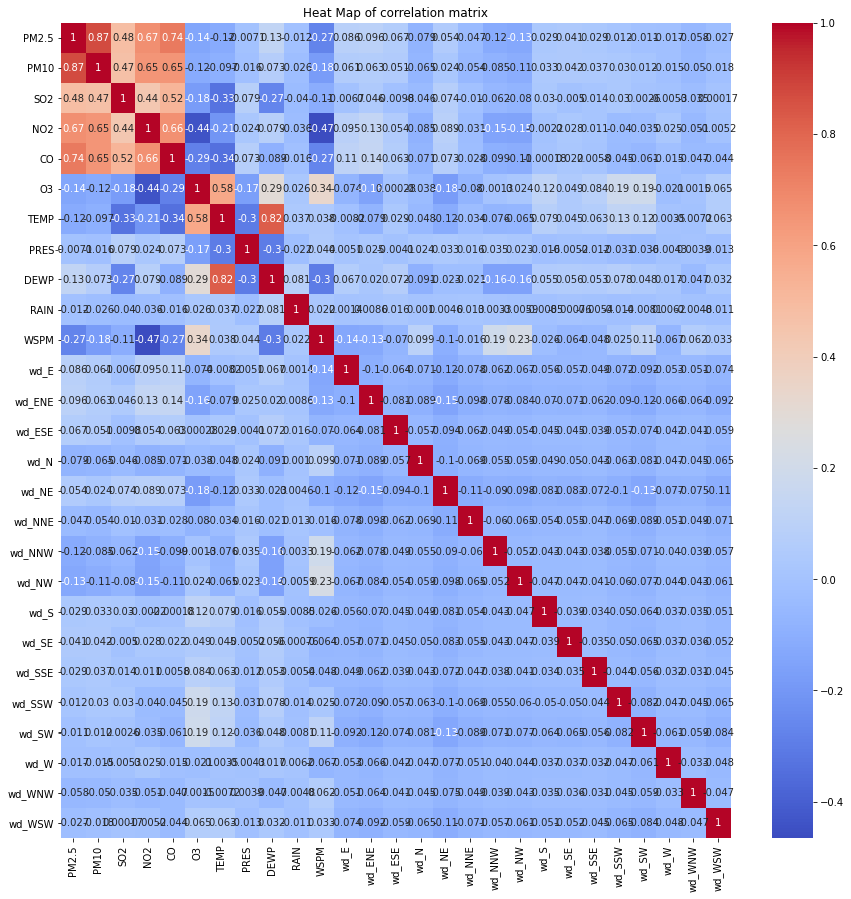

In [17]:
# Plotting the correlation matrix of attributes
plt.figure(figsize=(15,15))
sns.heatmap(data_original.corr(), annot=True, cmap="coolwarm").set_title('Heat Map of correlation matrix')
plt.show()

In [18]:
# ========== ARIMAX model ========== 

# scaling the data due to difference in range of values of attributes
data_arimax = data_original.copy()
scaler = preprocessing.StandardScaler().fit(data_arimax)
data_arimax = pd.DataFrame(scaler.transform(data_arimax))

In [19]:
print(data_arimax.describe())

                 0             1             2             3             4   \
count  3.506400e+04  3.506400e+04  3.506400e+04  3.506400e+04  3.506400e+04   
mean   6.094226e-16  2.846438e-15 -4.706365e-15  1.670580e-14 -1.373598e-14   
std    1.000014e+00  1.000014e+00  1.000014e+00  1.000014e+00  1.000014e+00   
min   -9.813404e-01 -1.128606e+00 -7.453857e-01 -1.518832e+00 -9.812542e-01   
25%   -7.378014e-01 -7.621983e-01 -6.131670e-01 -7.801975e-01 -5.720493e-01   
50%   -2.994313e-01 -2.492274e-01 -3.928025e-01 -1.470824e-01 -3.265264e-01   
75%    3.824777e-01  4.731193e-01  1.801451e-01  6.179315e-01  2.463604e-01   
max    9.953558e+00  9.172686e+00  1.428347e+01  6.131308e+00  7.202843e+00   

                 5             6             7             8             9   \
count  3.506400e+04  3.506400e+04  3.506400e+04  3.506400e+04  3.506400e+04   
mean   1.575323e-15  1.300796e-15 -2.919937e-15 -6.792295e-17 -3.252946e-15   
std    1.000014e+00  1.000014e+00  1.000014e+00  1.

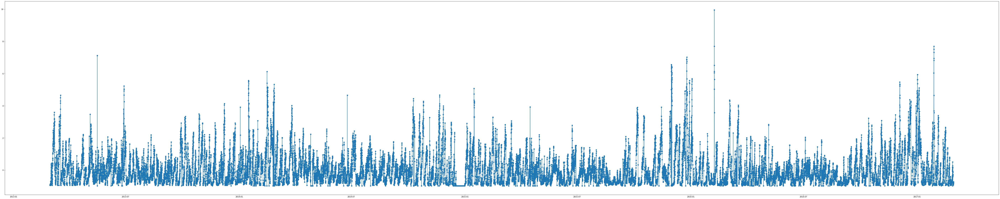

In [20]:
# Drawing a time series graph to start with
plt.figure(figsize=(100,20))  
plt.plot_date(x_time, data_arimax.iloc[:,0], linestyle='-')
plt.show()

<Figure size 432x288 with 0 Axes>

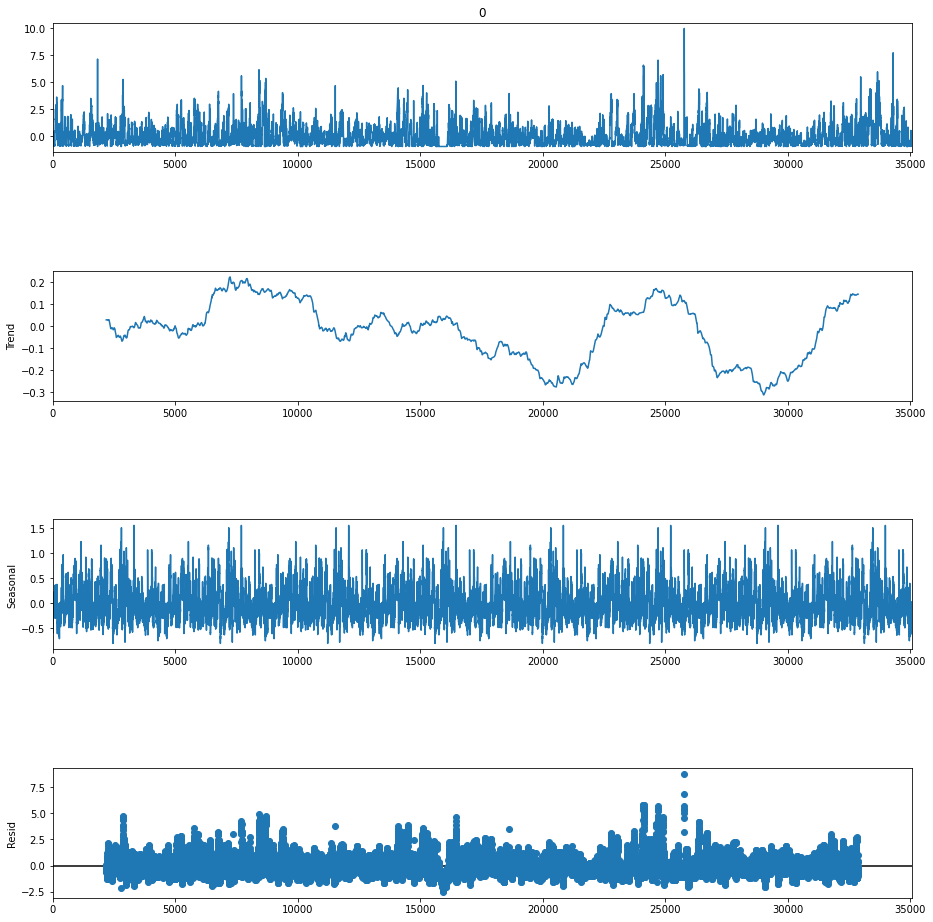

In [21]:
# Checking for trend and seasonality

decompose = seasonal_decompose(data_arimax.iloc[:,0], model='additive', period=int(365*24/2))
fig = plt.figure()  
fig = decompose.plot()  
fig.set_size_inches(15, 15)

In [22]:
# removing seasonality
for i in range(27):
   tmp = seasonal_decompose(data_arimax.iloc[:,i], model='additive', period=int(365*24/2))
   data_arimax.iloc[:,i] = data_arimax.iloc[:,i] - tmp.seasonal

<Figure size 432x288 with 0 Axes>

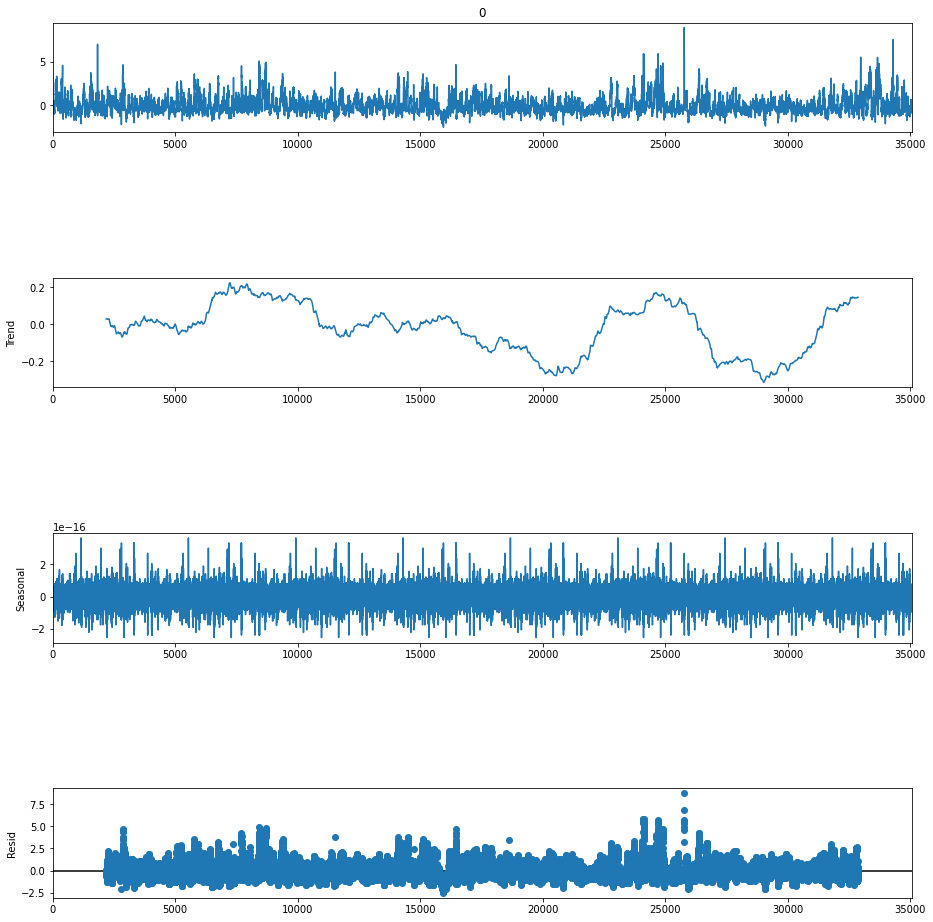

In [23]:
# Checking for trend and seasonality again

decompose = seasonal_decompose(data_arimax.iloc[:,0], model='additive', period=int(365*24/2))
fig = plt.figure()  
fig = decompose.plot()  
fig.set_size_inches(15, 15)

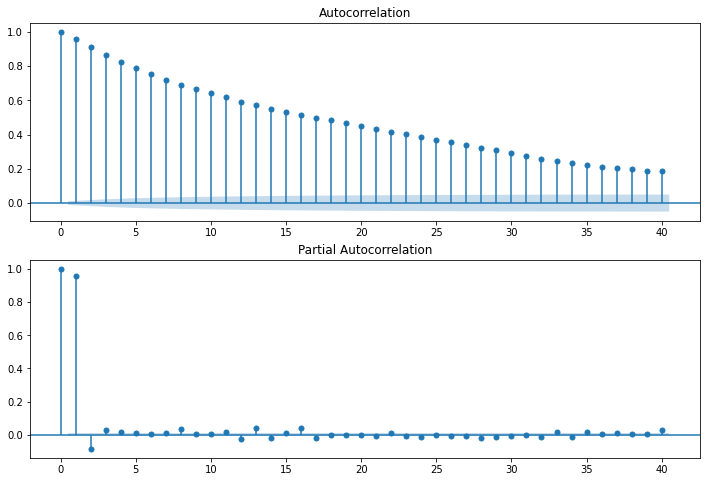

In [24]:
# finding the optimal lag
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = plot_acf(data_arimax.iloc[:,0],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_pacf(data_arimax.iloc[:,0],lags=40,ax=ax2)

In [26]:
lag = 1

In [27]:
# checking whether data is stationary or not
for _,i in data_arimax.iteritems():
  result = adfuller(i, autolag='AIC',maxlag=1)
  print(result)

(-29.783307835780366, 0.0, 1, 35062, {'1%': -3.430536520415736, '5%': -2.861622437419146, '10%': -2.5668138788464785}, 8386.312697786067)
(-34.89623533982464, 0.0, 1, 35062, {'1%': -3.430536520415736, '5%': -2.861622437419146, '10%': -2.5668138788464785}, 30373.847495172362)
(-31.605459855167357, 0.0, 1, 35062, {'1%': -3.430536520415736, '5%': -2.861622437419146, '10%': -2.5668138788464785}, 14282.056092492436)
(-37.745008955698594, 0.0, 1, 35062, {'1%': -3.430536520415736, '5%': -2.861622437419146, '10%': -2.5668138788464785}, 31241.693771817678)
(-32.883306014897315, 0.0, 1, 35062, {'1%': -3.430536520415736, '5%': -2.861622437419146, '10%': -2.5668138788464785}, 29579.429581618097)
(-37.25808734806515, 0.0, 1, 35062, {'1%': -3.430536520415736, '5%': -2.861622437419146, '10%': -2.5668138788464785}, 15900.164361178497)
(-17.840986324814626, 3.106228859669199e-30, 1, 35062, {'1%': -3.430536520415736, '5%': -2.861622437419146, '10%': -2.5668138788464785}, -67191.40650260942)
(-65.4739175

In [28]:
# data is stationary, no differencing required

In [29]:
y_arimax = data_arimax.iloc[:,0]
x_arimax = data_arimax.iloc[:,1:]

In [30]:
# Dividing the data into train and test
split_train_test = int(len(data_arimax) * 0.8)
x_train, y_train = x_arimax[:split_train_test],y_arimax[:split_train_test]
x_test, y_test =  x_arimax[split_train_test-1:],y_arimax[split_train_test-1:]

In [31]:
# Creating and training an ARIMAX model
model_arimax=ARIMA(endog=y_train,exog=x_train,order=[1,0,1])
model_arimax=model_arimax.fit()

/Users/nileshsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


In [32]:
print(model_arimax.summary())

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                28051
Model:                     ARMA(1, 1)   Log Likelihood                3428.245
Method:                       css-mle   S.D. of innovations              0.214
Date:                Tue, 02 Nov 2021   AIC                          -6796.490
Time:                        13:58:26   BIC                          -6549.237
Sample:                             0   HQIC                         -6716.901
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0156      0.016     -1.002      0.316      -0.046       0.015
1              0.3264      0.004     86.214      0.000       0.319       0.334
2              0.1187      0.004     27.610      0.0

In [33]:
# from z-test, we remove attributes with coeff having p-value > 0.05.
# These attributes do not impact the target variable PM2.5

In [34]:
x_arimax = x_arimax.drop(x_arimax.columns[[6,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]], axis=1)

In [35]:
# Dividing the data into train and test again
split_train_test = int(len(data_arimax) * 0.8)
x_train = x_arimax[:split_train_test]
x_test =  x_arimax[split_train_test-1:]

In [36]:
# Creating and training an ARIMAX model
model_arimax=ARIMA(endog=y_train,exog=x_train,order=[1,0,1])
model_arimax=model_arimax.fit()

/Users/nileshsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


In [37]:
print(model_arimax.summary())

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                28051
Model:                     ARMA(1, 1)   Log Likelihood                3415.273
Method:                       css-mle   S.D. of innovations              0.214
Date:                Tue, 02 Nov 2021   AIC                          -6808.546
Time:                        14:01:55   BIC                          -6717.886
Sample:                             0   HQIC                         -6779.363
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0157      0.016     -1.011      0.312      -0.046       0.015
1              0.3264      0.004     86.273      0.000       0.319       0.334
2              0.1186      0.004     27.618      0.0

In [38]:
# predicting values
predict_train = model_arimax.predict(exog=x_train, dynamic=True)
predict_test = model_arimax.predict(start=len(predict_train)-1,end=len(predict_train)+len(x_test)-1,exog=x_test, dynamic=True)

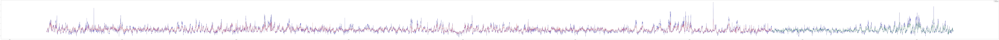

In [39]:
# plot the result
plt.figure(figsize=(500, 20))
plt.plot(x_time[:], y_arimax, color="b", label="actual value")
plt.plot(x_time[lag:split_train_test], predict_train, color="r", linestyle="dashed", label="train data prediction")
plt.plot(x_time[split_train_test-1-lag:], predict_test, color="g", linestyle="dashed", label="test data prediction")
plt.legend()
plt.show()

In [40]:
# precision check (error check)
print(mean_squared_error(predict_test, y_arimax.iloc[split_train_test-1-lag:,]))

0.28745556887879187


In [41]:
# ========== LSTM with RNN model ========== 

# scaling the data for RNN
data_rnn = data_original.copy()

scaler = preprocessing.StandardScaler().fit(data_rnn)
data_rnn = pd.DataFrame(scaler.transform(data_rnn))
print(data_rnn)

             0         1         2         3         4         5         6   \
0     -0.932633 -1.086731 -0.569094 -1.334173 -0.735731  0.405189 -1.252323   
1     -0.883925 -1.044856 -0.569094 -1.334173 -0.735731  0.405189 -1.287410   
2     -0.896102 -1.055324 -0.525021 -1.255034 -0.735731  0.335954 -1.287410   
3     -0.908279 -1.065793 -0.260584 -1.228654 -0.735731  0.318645 -1.313725   
4     -0.944810 -1.097200 -0.216511 -1.202274 -0.735731  0.318645 -1.366355   
...         ...       ...       ...       ...       ...       ...       ...   
35059 -0.835217 -0.825011 -0.525021 -0.595539 -0.653890  0.716749 -0.094459   
35060 -0.823040 -0.741261 -0.436875 -0.331741 -0.572049  0.474425 -0.173404   
35061 -0.786509 -0.741261 -0.304657  0.222235 -0.408367  0.076321 -0.243578   
35062 -0.725624 -0.667979 -0.216511  0.776210 -0.408367 -0.321783 -0.269893   
35063 -0.749978 -0.804073 -0.304657  0.565172 -0.490208 -0.200621 -0.436555   

             7         8         9         10      

In [42]:
# the optimum length of lag found earlier
lag = 1

In [43]:
# defining a function to create a dataset for RNN
def make_dataset(data, duration):
    X = []
    y = []

    for i in range(len(data) - duration):
        X.append(data[i : i + duration])
        y.append(data[i + duration])
    X = np.array(X).reshape(len(X), duration, 1)
    y = np.array(y).reshape(len(y), 1)

    return X, y

In [44]:
# transfering the format of the dataset by using the funciton 
x = -1
y = -1
isFirst = True

# the first row of the dataset is the target, so it is stored as y value
for i in range(27):
  xx, yy = make_dataset(data_rnn.iloc[:,i], lag)
  if isFirst:
    x = xx
    y = yy
    isFirst = False
  else:
    x = np.concatenate([x,xx], axis=2)


In [45]:
# total size of the data
total_size = len(data_rnn) - lag

# defining the train size
train_size = int(total_size*0.8)

# splitting the dataset into train, validation and test
x_train, y_train = x[:train_size],y[:train_size]
x_test, y_test = x[train_size-1:],y[train_size-1:]

test_size = int((len(x_test)-lag)*0.5)

x_valid, y_valid = x_test[:test_size], y_test[:test_size]
x_test, y_test = x_test[test_size-1:], y_test[test_size-1:]

In [46]:
#checking the size of train, validation and test data
print("Size of y_train: ", y_train.shape)
print("Size of x_train: ", x_train.shape)
print("Size of y_valid: ", y_valid.shape)
print("Size of x_valid: ", x_valid.shape)
print("Size of y_test: ", y_test.shape)
print("Size of x_test: ", x_test.shape)

Size of y_train:  (28050, 1)
Size of x_train:  (28050, 1, 27)
Size of y_valid:  (3506, 1)
Size of x_valid:  (3506, 1, 27)
Size of y_test:  (3509, 1)
Size of x_test:  (3509, 1, 27)


In [47]:
# creating LSTM with RNN model and training it
model_rnn = Sequential()
model_rnn.add(LSTM(16,dropout=0.2, return_sequences=True, input_shape=((np.array(x_train).shape[1], np.array(x_train).shape[2]))))
#model_rnn.add(LSTM(16,dropout=0.2, return_sequences=True))
model_rnn.add(LSTM(16,dropout=0.2))
model_rnn.add(Dense(1))

model_rnn.summary()

model_rnn.compile(loss='mean_squared_error', optimizer='adam')
history = model_rnn.fit(x_train, y_train, epochs=50, batch_size=128, verbose=1, validation_data=(x_valid,y_valid), shuffle=False)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 1, 16)             2816      
_________________________________________________________________
lstm_1 (LSTM)                (None, 16)                2112      
_________________________________________________________________
dense (Dense)                (None, 1)                 17        
Total params: 4,945
Trainable params: 4,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
220/220 [==============================] - 3s 5ms/step - loss: 0.6257 - val_loss: 0.0931
Epoch 2/50
220/220 [==============================] - 0s 2ms/step - loss: 0.2538 - val_loss: 0.0563
Epoch 3/50
220/220 [==============================] - 0s 2ms/step - loss: 0.2305 - val_loss: 0.0516
Epoch 4/50
220/220 [==============================] - 0s 2ms/step - loss: 0.2187 - v

In [49]:
# making predictions
used_predictions = model_rnn.predict(np.concatenate([x_train,x_valid]))
test_predictions = model_rnn.predict(x_test)

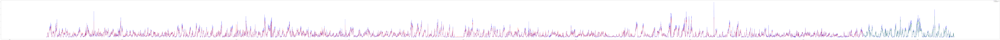

In [50]:
plt.figure(figsize=(500, 20))
plt.plot(x_time[:], data_rnn.iloc[:,0], color="b", label="actual value")
plt.plot(x_time[lag:lag + train_size+test_size], used_predictions, color="r", linestyle="dashed", label="train & valid data prediction")
plt.plot(x_time[lag + train_size+test_size-2:], test_predictions, color="g", linestyle="dashed", label="test data prediction")
plt.legend()
plt.show()

In [51]:
# checking the prediction score
scores = model_rnn.evaluate(x_test, y_test)

print(scores)

110/110 [==============================] - 0s 740us/step - loss: 0.1487
0.14868135750293732
